In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
class Dense(tf.Module):
    def __init__(self, out_shape, activation=None, name=None):
        super().__init__(name=name)
        self.out_shape = out_shape
        self.is_built = False
        self.activation = activation
        
    def __call__(self, X, w=None, b=None):
        
        ## Initializing for the firs time
        if not self.is_built:
            self.w = tf.Variable(tf.random.normal([X.shape[-1],self.out_shape]), name='w')
            self.b = tf.Variable(tf.zeros([self.out_shape]), name='b')
            self.is_built = True
        
         
        ## Forward propagation
        if w is None and b is None:
            y = tf.matmul(X, self.w) + self.b
        ## For predictign with custom weights 
        else:
            y = tf.matmul(X, w) + b
        
        ## Adding activation function
        
        if self.activation=='relu':
            y = tf.nn.relu(y)
        elif self.activation=='sigmoid':
            y = tf.nn.sigmoid(y)
            
        return y
        

In [3]:
class Model(tf.Module):
    def __init__(self, layers, name=None):
        super().__init__(name=name)
        self.layers = layers
    
    def __call__(self, X, w=None, b=None):
        inputs = X
        for i, layer in enumerate(self.layers):
            if w is None and b is None:
                inputs = layer(inputs)
            ## For predictign with custom weights 
            else:
                inputs = layer(inputs, w[i], b[i])
        return inputs
        

In [19]:
def plot_los_landscape2d(model, loss_fn, X, Y, steps=100, direction_samples=200, step_size=0.1):
    W = []
    B = []
    deltas_w = []
    deltas_b = []
    alphas = list(np.arange(-steps,0, step_size)) + list(np.arange(0, steps, step_size))
    losses = []

    for layer in model.layers:
        W.append(layer.w)
        B.append(layer.b)
        deltas_w.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.w.shape),axis=0))
        deltas_b.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.b.shape),axis=0))
        
    for alpha in alphas:
    
        W_m = []
        B_m = []

        for l in range(len(W)):
            w_m = W[l] + alpha * deltas_w[l]
            b_m = B[l] + alpha * deltas_b[l]
            W_m.append(w_m)
            B_m.append(b_m)

        predicted = model(X, W_m, B_m)
        loss_value = loss_fn(Y, predicted)
        losses.append(loss_value.numpy())
        
    plt.figure(figsize=(10,7))
    sns.lineplot(x=alphas, y=losses)
    plt.show()

    return alphas, losses
    


    

In [27]:
def plot_los_landscape3d(model, loss_fn, X, Y, direction_samples=100, steps=10, step_size=0.1):
    
    
    W = []
    B = []
    deltas_w = []
    deltas_b = []
    nue_w = []
    nue_b = []
    
    alphas = list(np.arange(-steps,0, step_size)) + list(np.arange(0, steps, step_size))
    betas = list(np.arange(-steps,0, step_size)) + list(np.arange(0, steps, step_size))
    losses = []
    

    for layer in model.layers:
        W.append(layer.w)
        B.append(layer.b)
        deltas_w.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.w.shape),axis=0))
        deltas_b.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.b.shape),axis=0))
        nue_w.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.w.shape),axis=0))
        nue_b.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.b.shape),axis=0))


    for alpha in alphas:
        loss_for_alpha = []
        for beta in betas:            
    
            W_m = []
            B_m = []

            for l in range(len(W)):
                w_m = W[l] + alpha * deltas_w[l] + beta * nue_w[l]
                b_m = B[l] + alpha * deltas_b[l] + beta * nue_b[l]
                W_m.append(w_m)
                B_m.append(b_m)
                
            

            predicted = model(X, W_m, B_m)
            loss_value = loss_fn(Y, predicted)
            loss_for_alpha.append(loss_value.numpy())
        losses.append(loss_for_alpha)
        
#    plt.figure(figsize=(10,7))
#    sns.lineplot(x=alphas, y=losses)
#    plt.show()

    return alphas, betas, losses
    


    

In [ ]:
def plot_los_landscape33333d(model, loss_fn, X, Y, direction_samples=100, steps=10, step_size=0.1):
    W = []
    B = []
    deltas_w = []
    deltas_b = []
    nue_w = []
    nue_b = []
    
    alphas = list(np.arange(-steps,0, step_size)) + list(np.arange(0, steps, step_size))
    betas = list(np.arange(-steps,0, step_size)) + list(np.arange(0, steps, step_size))
    losses = []

    for layer in model.layers:
        W.append(layer.w)
        B.append(layer.b)
        deltas_w.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.w.shape),axis=0))
        deltas_b.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.b.shape),axis=0))
        nue_w.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.w.shape),axis=0))
        nue_b.append(tf.reduce_mean(tf.random.normal(shape=[direction_samples,]+layer.b.shape),axis=0))
        
        
    W_m = []
    B_m = []
    for l in range(len(W)):
        layer_wm = []
        layer_wb = []
        for beta in betas:
            w_m = W[l] + beta * nue_w[l]
            b_m = B[l] + beta * nue_b[l]
            layer_wm.append(w_m)
            layer_wb.append(b_m)
            
        W_m.append(tf.Variable(layer_wm))
        B_m.append(tf.Variable(layer_wb))
        
        
    for l in range(len(W)):
        for alpha in alphas:
            W_m[l] += alpha * deltas_w[l]
            
        
    
    
                
            
            
        

        
    for alpha in alphas:
        loss_for_alpha = []
        for beta in betas:            
    
            W_m = []
            B_m = []

            for l in range(len(W)):
                w_m = W[l] + alpha * deltas_w[l] + beta * nue_w[l]
                b_m = B[l] + alpha * deltas_b[l] + beta * nue_b[l]
                W_m.append(w_m)
                B_m.append(b_m)
                
            

            predicted = model(X, W_m, B_m)
            loss_value = loss_fn(Y, predicted)
            loss_for_alpha.append(loss_value.numpy())
        losses.append(loss_for_alpha)
        
#    plt.figure(figsize=(10,7))
#    sns.lineplot(x=alphas, y=losses)
#    plt.show()

    return alphas, betas, losses
    


    

### Simple Dataset

In [6]:
X = tf.constant([[0,0], [0,1], [1,0], [1,1]], dtype='float32')
Y = tf.constant([[0], [1], [1], [0]], dtype='float32')


### Model


- RELU activation

In [99]:
dense1 = Dense(4, activation ='relu')
dense2 = Dense(2, activation ='relu')
dense3 = Dense(1)

model1 = Model([dense1, dense2, dense3])

In [100]:
## Trainign Loop
B1, W1, B2, W2, B3, W3 = [], [], [], [], [], []
loss_history = []
epochs = 100
# Instantiate an optimizer to train the model.
optimizer = tf.keras.optimizers.SGD(learning_rate=1e-1)
loss_fn = tf.keras.losses.MeanSquaredError()
for epoch in range(epochs):
    
    with tf.GradientTape() as tape:
        preds = model1(X)
        loss_value = loss_fn(Y, preds)
    B1.append(model1.trainable_variables[0].numpy())
    W1.append(model1.trainable_variables[1].numpy())
    B2.append(model1.trainable_variables[2].numpy())
    W2.append(model1.trainable_variables[3].numpy())
    B3.append(model1.trainable_variables[4].numpy())
    W3.append(model1.trainable_variables[5].numpy())
    grads = tape.gradient(loss_value, model1.trainable_variables)
    optimizer.apply_gradients(zip(grads, model1.trainable_variables))

    print(f"Epoch {epoch+1}: \n mean_squared_error: {loss_value}")

    
        

Epoch 1: 
 mean_squared_error: 0.28709691762924194
Epoch 2: 
 mean_squared_error: 0.2378600537776947
Epoch 3: 
 mean_squared_error: 0.21178096532821655
Epoch 4: 
 mean_squared_error: 0.1967441290616989
Epoch 5: 
 mean_squared_error: 0.1867118775844574
Epoch 6: 
 mean_squared_error: 0.1789034903049469
Epoch 7: 
 mean_squared_error: 0.17217223346233368
Epoch 8: 
 mean_squared_error: 0.16611844301223755
Epoch 9: 
 mean_squared_error: 0.16051733493804932
Epoch 10: 
 mean_squared_error: 0.15517811477184296
Epoch 11: 
 mean_squared_error: 0.15001440048217773
Epoch 12: 
 mean_squared_error: 0.14489583671092987
Epoch 13: 
 mean_squared_error: 0.13982562720775604
Epoch 14: 
 mean_squared_error: 0.1347753405570984
Epoch 15: 
 mean_squared_error: 0.12972697615623474
Epoch 16: 
 mean_squared_error: 0.125069260597229
Epoch 17: 
 mean_squared_error: 0.12050525844097137
Epoch 18: 
 mean_squared_error: 0.11542223393917084
Epoch 19: 
 mean_squared_error: 0.11030305176973343
Epoch 20: 
 mean_squared_err

In [101]:
B1

[array([0., 0., 0., 0.], dtype=float32),
 array([0.01376532, 0.00680504, 0.00264501, 0.        ], dtype=float32),
 array([0.03252741, 0.00992948, 0.0008218 , 0.        ], dtype=float32),
 array([ 0.04902122,  0.01028432, -0.00436792,  0.        ], dtype=float32),
 array([ 0.06367796,  0.00874738, -0.00874783,  0.        ], dtype=float32),
 array([ 0.07688428,  0.00595537, -0.01403274,  0.        ], dtype=float32),
 array([ 0.08895537,  0.00235907, -0.01980709,  0.        ], dtype=float32),
 array([ 0.1001257, -0.0017623, -0.0258238,  0.       ], dtype=float32),
 array([ 0.11054642, -0.00071125, -0.03194445,  0.        ], dtype=float32),
 array([ 0.12031278,  0.00025638, -0.03813499,  0.        ], dtype=float32),
 array([ 0.12952125, -0.00487726, -0.04433349,  0.        ], dtype=float32),
 array([ 0.13825051, -0.00392375, -0.0504573 ,  0.        ], dtype=float32),
 array([ 0.14654027, -0.0030056 , -0.05655929,  0.        ], dtype=float32),
 array([ 0.1544332 , -0.00211484, -0.06262056, 

In [102]:
B1 = tf.Variable(B1)
W1 = tf.Variable(W1)
B2 = tf.Variable(B2)
W2 = tf.Variable(W2)
B3 = tf.Variable(B3)
W3 = tf.Variable(W3)

In [103]:
def plotWeights(variable):
    
    epochs = variable.shape[0]
    neurons = variable.shape[-1]
    inputs = variable.shape[1] if len(variable.shape)>2 else 1
    
    plt.figure(figsize=(10,10))
    for n in range(neurons):
        for i in range(inputs):
            #print(neurons, inputs, n*inputs+i+1)
            plt.subplot(neurons, inputs, n*inputs+i+1)
            if len(variable.shape)>2:
                sns.lineplot(x=list(range(epochs)), y=variable[:,i,n])
            else:
                sns.lineplot(x=list(range(epochs)), y=variable[:,n])
    plt.show()
    

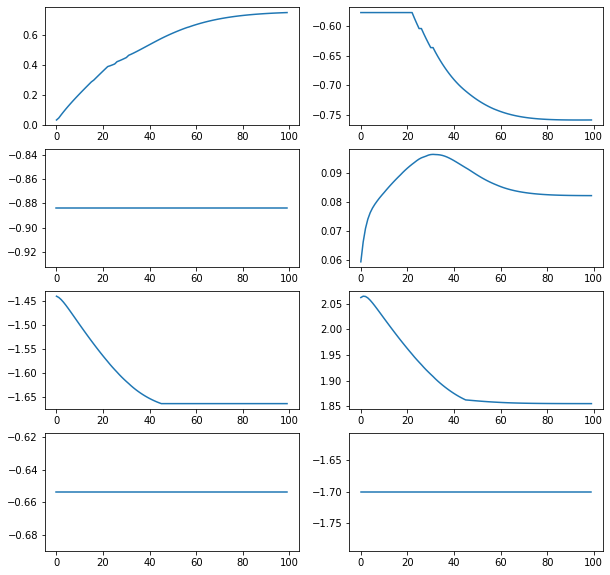

In [104]:
plotWeights(W1)

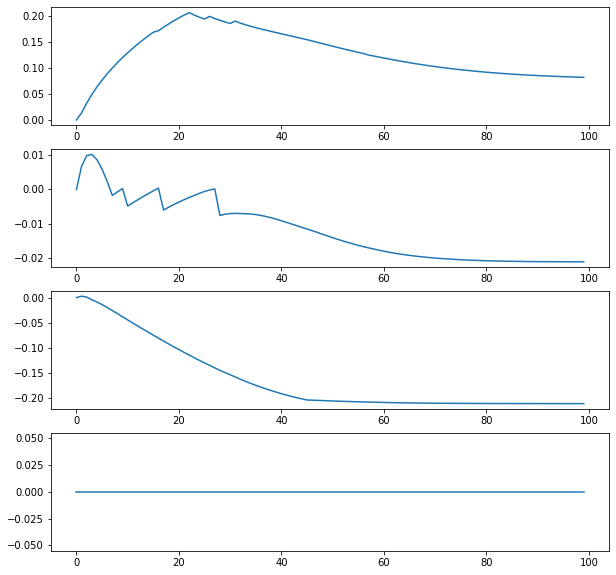

In [105]:
plotWeights(B1)

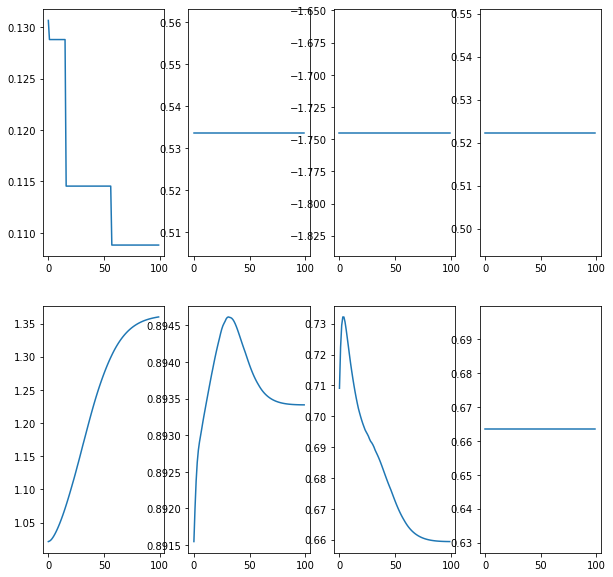

In [106]:
plotWeights(W2)

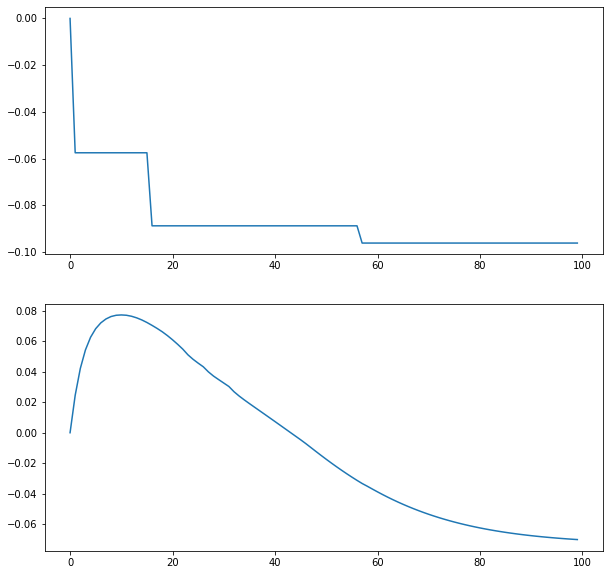

In [107]:
plotWeights(B2)

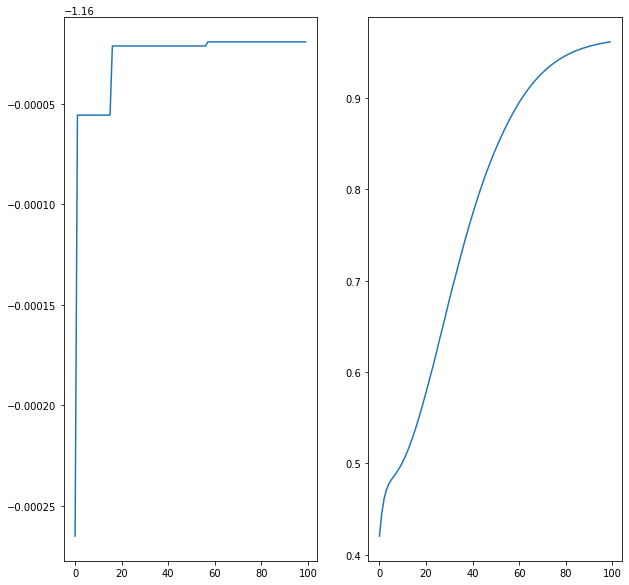

In [108]:
plotWeights(W3)

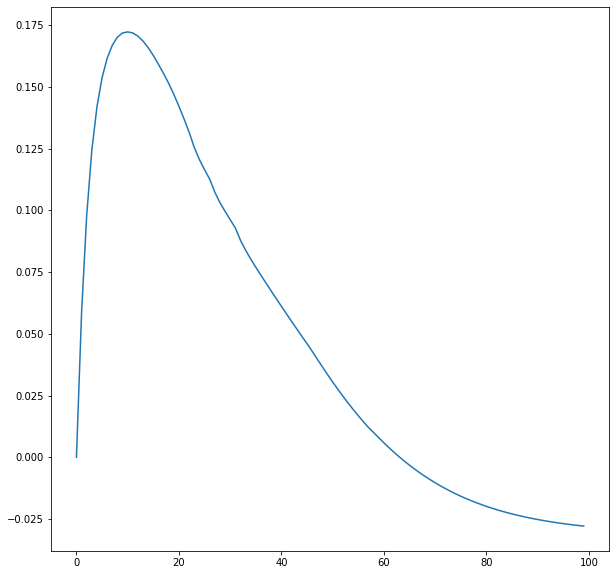

In [109]:
plotWeights(B3)

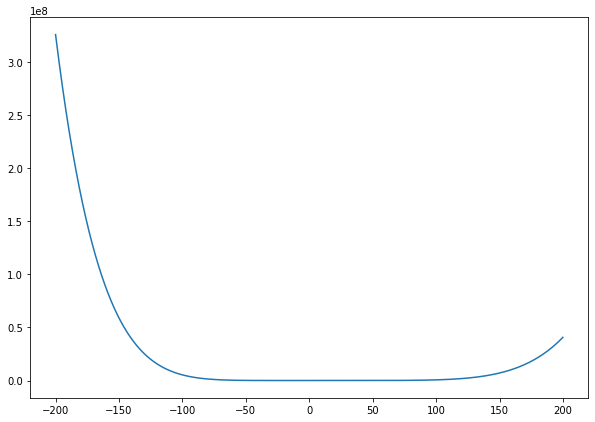

In [110]:
alphas, losses = plot_los_landscape2d(model1, loss_fn, X, Y, steps=200, step_size=0.1)

### Model


- Sigmoid activation

In [115]:
dense4 = Dense(2, activation ='sigmoid')
dense5 = Dense(1)

model2 = Model([dense4, dense5])

In [116]:
## Trainign Loop

epochs = 500
# Instantiate an optimizer to train the model.
optimizer = tf.keras.optimizers.SGD(learning_rate=1e-1)
loss_fn = tf.keras.losses.MeanSquaredError()
for epoch in range(epochs):
    
    with tf.GradientTape() as tape:
        preds = model2(X)
        loss_value = loss_fn(Y, preds)
    grads = tape.gradient(loss_value, model2.trainable_variables)
    optimizer.apply_gradients(zip(grads, model2.trainable_variables))

    print(f"Epoch {epoch+1}: \n mean_squared_error: {loss_value}")

    
        

Epoch 1: 
 mean_squared_error: 0.5786804556846619
Epoch 2: 
 mean_squared_error: 0.4265443682670593
Epoch 3: 
 mean_squared_error: 0.34610801935195923
Epoch 4: 
 mean_squared_error: 0.3034362196922302
Epoch 5: 
 mean_squared_error: 0.2807539105415344
Epoch 6: 
 mean_squared_error: 0.2686781585216522
Epoch 7: 
 mean_squared_error: 0.26223674416542053
Epoch 8: 
 mean_squared_error: 0.2587900161743164
Epoch 9: 
 mean_squared_error: 0.25693535804748535
Epoch 10: 
 mean_squared_error: 0.25592726469039917
Epoch 11: 
 mean_squared_error: 0.2553693652153015
Epoch 12: 
 mean_squared_error: 0.25505104660987854
Epoch 13: 
 mean_squared_error: 0.2548602819442749
Epoch 14: 
 mean_squared_error: 0.25473758578300476
Epoch 15: 
 mean_squared_error: 0.25465127825737
Epoch 16: 
 mean_squared_error: 0.25458455085754395
Epoch 17: 
 mean_squared_error: 0.2545284628868103
Epoch 18: 
 mean_squared_error: 0.25447824597358704
Epoch 19: 
 mean_squared_error: 0.25443142652511597
Epoch 20: 
 mean_squared_error: 0

Epoch 162: 
 mean_squared_error: 0.25121110677719116
Epoch 163: 
 mean_squared_error: 0.2512006461620331
Epoch 164: 
 mean_squared_error: 0.25119027495384216
Epoch 165: 
 mean_squared_error: 0.2511799931526184
Epoch 166: 
 mean_squared_error: 0.25116977095603943
Epoch 167: 
 mean_squared_error: 0.25115966796875
Epoch 168: 
 mean_squared_error: 0.25114962458610535
Epoch 169: 
 mean_squared_error: 0.25113970041275024
Epoch 170: 
 mean_squared_error: 0.25112980604171753
Epoch 171: 
 mean_squared_error: 0.25112006068229675
Epoch 172: 
 mean_squared_error: 0.25111034512519836
Epoch 173: 
 mean_squared_error: 0.25110071897506714
Epoch 174: 
 mean_squared_error: 0.25109124183654785
Epoch 175: 
 mean_squared_error: 0.2510817348957062
Epoch 176: 
 mean_squared_error: 0.25107240676879883
Epoch 177: 
 mean_squared_error: 0.25106310844421387
Epoch 178: 
 mean_squared_error: 0.2510538697242737
Epoch 179: 
 mean_squared_error: 0.25104475021362305
Epoch 180: 
 mean_squared_error: 0.2510357201099396
E

Epoch 326: 
 mean_squared_error: 0.2502495050430298
Epoch 327: 
 mean_squared_error: 0.25024643540382385
Epoch 328: 
 mean_squared_error: 0.2502433955669403
Epoch 329: 
 mean_squared_error: 0.25024038553237915
Epoch 330: 
 mean_squared_error: 0.250237375497818
Epoch 331: 
 mean_squared_error: 0.25023436546325684
Epoch 332: 
 mean_squared_error: 0.25023138523101807
Epoch 333: 
 mean_squared_error: 0.2502284348011017
Epoch 334: 
 mean_squared_error: 0.2502255141735077
Epoch 335: 
 mean_squared_error: 0.2502225935459137
Epoch 336: 
 mean_squared_error: 0.2502197027206421
Epoch 337: 
 mean_squared_error: 0.25021684169769287
Epoch 338: 
 mean_squared_error: 0.25021395087242126
Epoch 339: 
 mean_squared_error: 0.25021111965179443
Epoch 340: 
 mean_squared_error: 0.2502082586288452
Epoch 341: 
 mean_squared_error: 0.25020545721054077
Epoch 342: 
 mean_squared_error: 0.25020265579223633
Epoch 343: 
 mean_squared_error: 0.25019991397857666
Epoch 344: 
 mean_squared_error: 0.2501971423625946
Epo

Epoch 491: 
 mean_squared_error: 0.24991394579410553
Epoch 492: 
 mean_squared_error: 0.2499125748872757
Epoch 493: 
 mean_squared_error: 0.24991118907928467
Epoch 494: 
 mean_squared_error: 0.24990986287593842
Epoch 495: 
 mean_squared_error: 0.2499084770679474
Epoch 496: 
 mean_squared_error: 0.24990710616111755
Epoch 497: 
 mean_squared_error: 0.2499057799577713
Epoch 498: 
 mean_squared_error: 0.24990442395210266
Epoch 499: 
 mean_squared_error: 0.24990305304527283
Epoch 500: 
 mean_squared_error: 0.24990171194076538


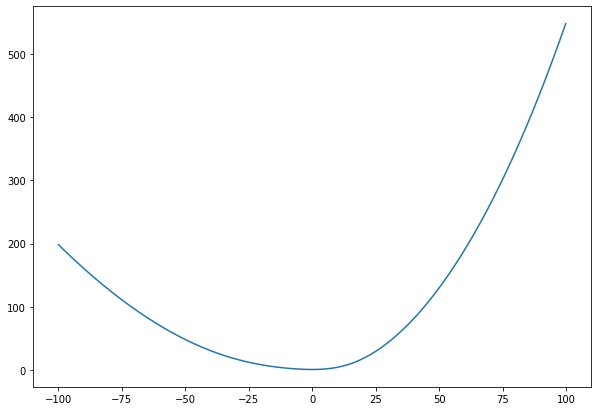

In [117]:
alphas, losses = plot_los_landscape2d(model2, loss_fn, X, Y, steps=100, step_size=0.1)

In [129]:
%time
alphas, betas, losses = plot_los_landscape3d(model2, loss_fn, X, Y, steps=10, step_size=0.1)

Wall time: 0 ns


In [130]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

fig = go.Figure(data=[go.Surface(z=losses, x=alphas, y=betas)])
fig.update_layout(title='Loss Landscape', autosize=False,
                  width=700, height=700,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [17]:
z = z_data.values

In [18]:
z.shape

(25, 25)

C:\Users\chaitanyamanem\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot: >

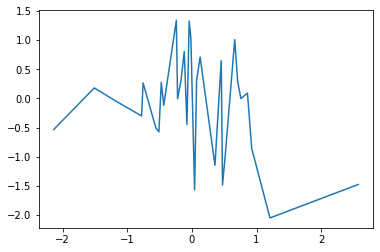

In [10]:
sns.lineplot(x,y)

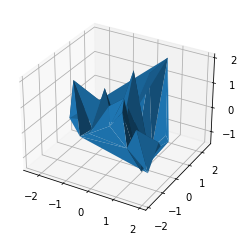

In [14]:
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

x=np.random.normal(size=(30))
y=np.random.normal(size=(30))
z=np.random.normal(size=(30))

# Plot the surface
ax.plot_trisurf(x, y, z)

# Set an equal aspect ratio
ax.set_aspect('equal')

plt.show()

In [3]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
# Read data from a csv
z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
z = z_data.values
sh_0, sh_1 = z.shape
x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
fig.update_layout(title='Mt Bruno Elevation', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [42]:
z_data.values.shape

(25, 25)

In [43]:
x

array([0.        , 0.04166667, 0.08333333, 0.125     , 0.16666667,
       0.20833333, 0.25      , 0.29166667, 0.33333333, 0.375     ,
       0.41666667, 0.45833333, 0.5       , 0.54166667, 0.58333333,
       0.625     , 0.66666667, 0.70833333, 0.75      , 0.79166667,
       0.83333333, 0.875     , 0.91666667, 0.95833333, 1.        ])

In [6]:
from sklearn import datasets as ds
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [7]:
X,y = ds.make_regression(n_samples=2000, n_features=2, random_state=41)

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1000, random_state=41)

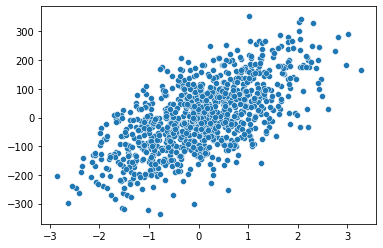

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.scatterplot(x=X_train[:,0], y=y_train)
plt.show()

In [10]:
import numpy as np
X_train = tf.convert_to_tensor(np.float32(X_train), dtype=tf.float32)
y_train = tf.convert_to_tensor(y_train)

X_test = tf.convert_to_tensor(np.float32(X_test), dtype=tf.float32)
y_test = tf.convert_to_tensor(y_test)

In [11]:
dense1 = Dense(20, activation='sigmoid')
dense2 = Dense(12, activation='sigmoid')
dense3 = Dense(1)
model1 = Model([dense1, dense2, dense3], name='model1')

In [12]:
## Trainign Loop
B1, W1, B2, W2, B3, W3 = [], [], [], [], [], []
loss_history = []
epochs = 500
# Instantiate an optimizer to train the model.
optimizer = tf.keras.optimizers.SGD(learning_rate=1e-2)
loss_fn = tf.keras.losses.MeanSquaredError()
for epoch in range(epochs):
    
    with tf.GradientTape() as tape:
        preds = model1(X_train)
        loss_value = loss_fn(y_train, preds)
    B1.append(model1.trainable_variables[0].numpy())
    W1.append(model1.trainable_variables[1].numpy())
    B2.append(model1.trainable_variables[2].numpy())
    W2.append(model1.trainable_variables[3].numpy())
    B3.append(model1.trainable_variables[4].numpy())
    W3.append(model1.trainable_variables[5].numpy())
    grads = tape.gradient(loss_value, model1.trainable_variables)
    optimizer.apply_gradients(zip(grads, model1.trainable_variables))

    print(f"Epoch {epoch+1}: \n mean_squared_error: {loss_value}")

Epoch 1: 
 mean_squared_error: 13964.8359375
Epoch 2: 
 mean_squared_error: 13796.6357421875
Epoch 3: 
 mean_squared_error: 13611.2958984375
Epoch 4: 
 mean_squared_error: 13328.4970703125
Epoch 5: 
 mean_squared_error: 12920.32421875
Epoch 6: 
 mean_squared_error: 12412.6708984375
Epoch 7: 
 mean_squared_error: 11849.94921875
Epoch 8: 
 mean_squared_error: 11262.515625
Epoch 9: 
 mean_squared_error: 10676.7373046875
Epoch 10: 
 mean_squared_error: 10112.8642578125
Epoch 11: 
 mean_squared_error: 9584.765625
Epoch 12: 
 mean_squared_error: 9096.8291015625
Epoch 13: 
 mean_squared_error: 8648.4580078125
Epoch 14: 
 mean_squared_error: 8237.3515625
Epoch 15: 
 mean_squared_error: 7860.68994140625
Epoch 16: 
 mean_squared_error: 7515.548828125
Epoch 17: 
 mean_squared_error: 7199.0693359375
Epoch 18: 
 mean_squared_error: 6908.51904296875
Epoch 19: 
 mean_squared_error: 6641.31494140625
Epoch 20: 
 mean_squared_error: 6395.01416015625
Epoch 21: 
 mean_squared_error: 6167.27685546875
Epoch

Epoch 181: 
 mean_squared_error: 588.8206176757812
Epoch 182: 
 mean_squared_error: 579.013916015625
Epoch 183: 
 mean_squared_error: 573.1939697265625
Epoch 184: 
 mean_squared_error: 564.7919921875
Epoch 185: 
 mean_squared_error: 560.0663452148438
Epoch 186: 
 mean_squared_error: 552.95361328125
Epoch 187: 
 mean_squared_error: 549.168701171875
Epoch 188: 
 mean_squared_error: 543.21337890625
Epoch 189: 
 mean_squared_error: 540.2219848632812
Epoch 190: 
 mean_squared_error: 535.3134155273438
Epoch 191: 
 mean_squared_error: 532.989501953125
Epoch 192: 
 mean_squared_error: 529.05126953125
Epoch 193: 
 mean_squared_error: 527.289306640625
Epoch 194: 
 mean_squared_error: 524.27587890625
Epoch 195: 
 mean_squared_error: 522.9789428710938
Epoch 196: 
 mean_squared_error: 520.863525390625
Epoch 197: 
 mean_squared_error: 519.9263916015625
Epoch 198: 
 mean_squared_error: 518.680419921875
Epoch 199: 
 mean_squared_error: 517.9691162109375
Epoch 200: 
 mean_squared_error: 517.53369140625

Epoch 354: 
 mean_squared_error: 250.038818359375
Epoch 355: 
 mean_squared_error: 247.37393188476562
Epoch 356: 
 mean_squared_error: 248.45774841308594
Epoch 357: 
 mean_squared_error: 245.78506469726562
Epoch 358: 
 mean_squared_error: 246.90219116210938
Epoch 359: 
 mean_squared_error: 244.21958923339844
Epoch 360: 
 mean_squared_error: 245.362548828125
Epoch 361: 
 mean_squared_error: 242.66915893554688
Epoch 362: 
 mean_squared_error: 243.8304901123047
Epoch 363: 
 mean_squared_error: 241.12698364257812
Epoch 364: 
 mean_squared_error: 242.3000946044922
Epoch 365: 
 mean_squared_error: 239.5876922607422
Epoch 366: 
 mean_squared_error: 240.766845703125
Epoch 367: 
 mean_squared_error: 238.0482635498047
Epoch 368: 
 mean_squared_error: 239.2282257080078
Epoch 369: 
 mean_squared_error: 236.50662231445312
Epoch 370: 
 mean_squared_error: 237.6830291748047
Epoch 371: 
 mean_squared_error: 234.96229553222656
Epoch 372: 
 mean_squared_error: 236.13156127929688
Epoch 373: 
 mean_square

In [13]:
B1 = tf.Variable(B1)
W1 = tf.Variable(W1)
B2 = tf.Variable(B2)
W2 = tf.Variable(W2)
B3 = tf.Variable(B3)
W3 = tf.Variable(W3)

In [14]:
def plotWeights(variable, figsize=(5,5)):
    
    epochs = variable.shape[0]
    neurons = variable.shape[-1]
    inputs = variable.shape[1] if len(variable.shape)>2 else 1
    
    plt.figure(figsize=figsize)
    for n in range(neurons):
        for i in range(inputs):
            #print(neurons, inputs, n*inputs+i+1)
            plt.subplot(neurons, inputs, n*inputs+i+1)
            if len(variable.shape)>2:
                sns.lineplot(x=list(range(epochs)), y=variable[:,i,n])
            else:
                sns.lineplot(x=list(range(epochs)), y=variable[:,n])
    plt.show()
    

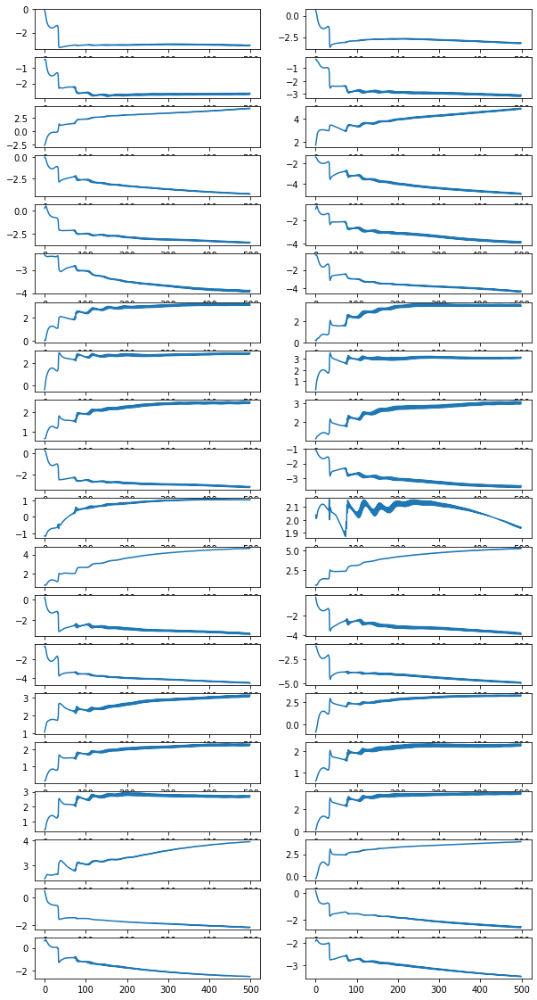

In [180]:
plotWeights(W1, figsize=(10,20))

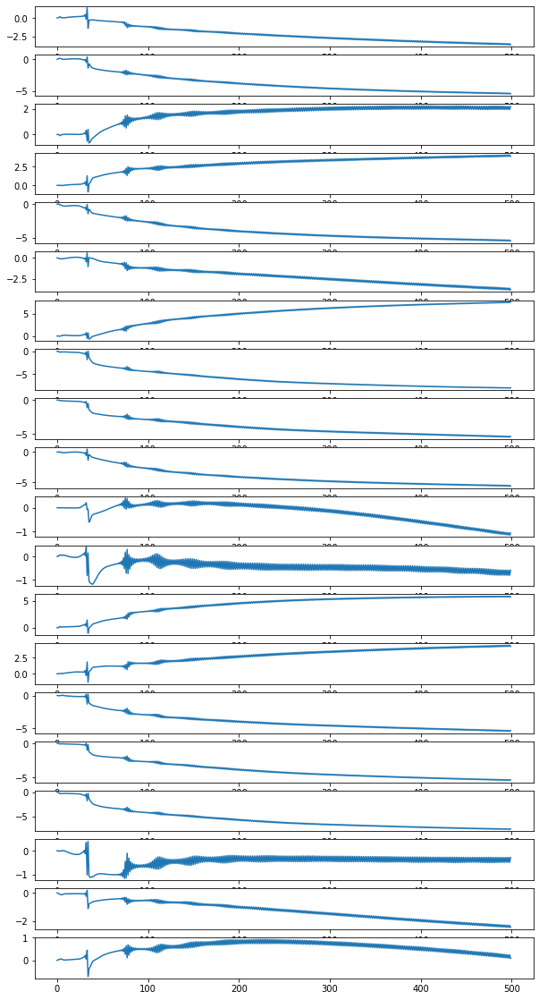

In [181]:
plotWeights(B1, figsize=(10,20))

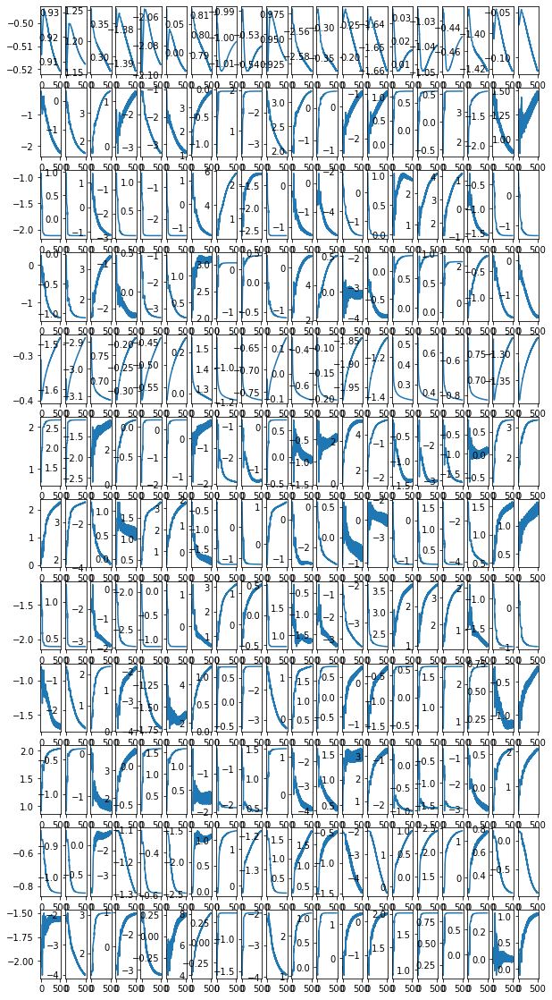

In [182]:
plotWeights(W2, figsize=(10,20))

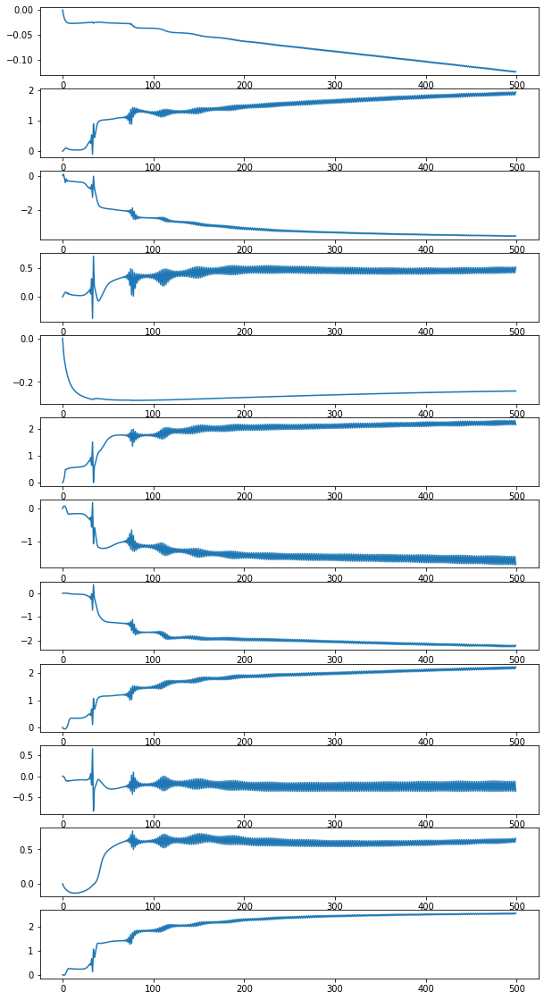

In [183]:
plotWeights(B2, figsize=(10,20))

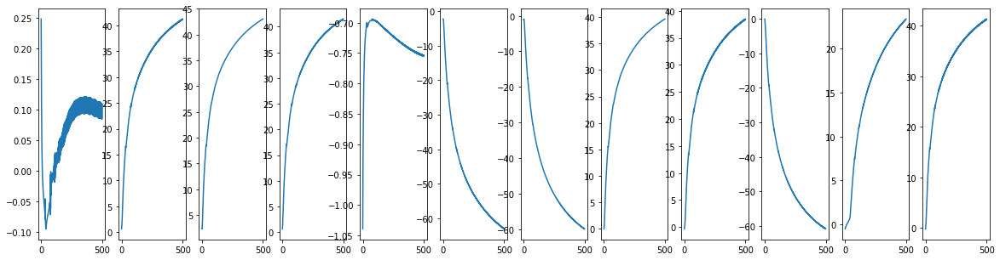

In [188]:
plotWeights(W3, figsize=(20,5))

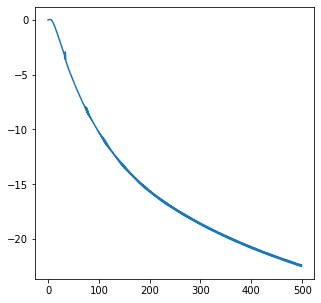

In [189]:
plotWeights(B3, figsize=(5,5))

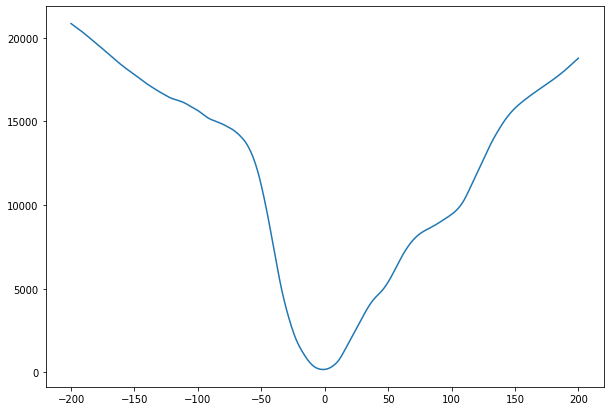

In [22]:
alphas, losses = plot_los_landscape2d(model1, loss_fn, X_train, y_train, steps=200, step_size=0.1)

In [35]:
alphas, betas, losses = plot_los_landscape3d(model1, loss_fn, X_train, y_train, steps=25, step_size=0.1)

In [36]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

fig = go.Figure(data=[go.Surface(z=losses, x=alphas, y=betas)])
fig.update_layout(title='Loss Landscape', autosize=False,
                  width=700, height=700,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.write_html("3d_loss_surface.html")
fig.show()

In [ ]:
figsize=(10,20)

In [246]:
W = []
B = []
deltas_w = []
deltas_b = []

for layer in model1.layers:
    W.append(layer.w)
    B.append(layer.b)
    deltas_w.append(tf.random.normal(shape=layer.w.shape))
    deltas_b.append(tf.random.normal(shape=layer.b.shape))
    


    

In [287]:
limit = 500
step = 0.1
alphas = list(np.arange(-limit,0, step)) + list(np.arange(0, limit, step))
losses = []

for alpha in alphas:
    
    W_m = []
    B_m = []

    for l in range(len(W)):
        w_m = W[l] + alpha * deltas_w[l]
        b_m = B[l] + alpha * deltas_b[l]
        W_m.append(w_m)
        B_m.append(b_m)
        
    predicted = model1(X_train, W_m, B_m)
    loss_value = loss_fn(y_train, predicted)
    losses.append(loss_value.numpy())
    

In [288]:
len(losses)

10000

In [289]:
len(alphas)

10000

<AxesSubplot: >

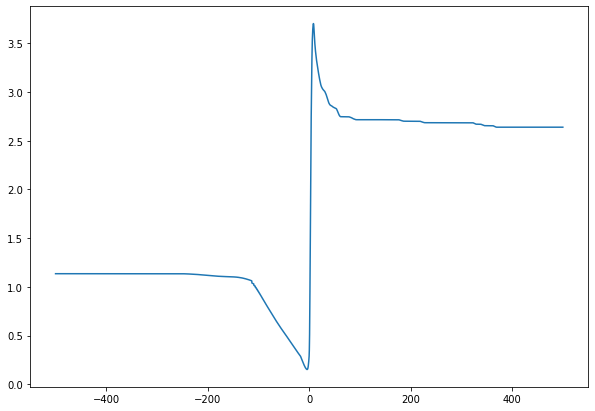

In [292]:
plt.figure(figsize=(10,7))
sns.lineplot(x=alphas, y=losses)

In [260]:
predicted = model1(X_train, W_m, B_m)
loss_value = loss_fn(y_train, predicted)
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.33080345>

In [261]:
predicted = model1(X_train, W, B)
loss_value = loss_fn(y_train, predicted)
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.3143929>

In [38]:
X = tf.random.normal(shape=(9,2))
W = tf.random.normal(shape=(2,3))
W1 = tf.random.normal(shape=(4,2,3))

In [40]:
X @ W

<tf.Tensor: shape=(9, 3), dtype=float32, numpy=
array([[ 1.4245725 , -0.32037875,  0.17560938],
       [ 0.35081002, -0.2466105 , -0.09848747],
       [-0.22585945,  0.3308571 ,  0.20883256],
       [ 0.08783919, -1.36013   , -1.1218934 ],
       [ 1.722185  , -1.3430777 , -0.5954014 ],
       [-0.8743694 , -0.9831538 , -1.1048033 ],
       [-5.082431  , -0.3323594 , -1.873323  ],
       [ 0.7372334 ,  0.38333938,  0.55494535],
       [ 3.3361485 ,  0.32675007,  1.3214284 ]], dtype=float32)>

In [43]:
A1 = X @ W1

In [44]:
W2 = tf.random.normal(shape=(4,3,2))

In [46]:
A1 @ W2

<tf.Tensor: shape=(4, 9, 2), dtype=float32, numpy=
array([[[-2.57315612e+00,  1.55773687e+00],
        [-1.16375279e+00,  7.12645292e-01],
        [ 1.29315448e+00, -7.96430469e-01],
        [-4.39517927e+00,  2.72575045e+00],
        [-6.13161325e+00,  3.75830221e+00],
        [-2.14962912e+00,  1.35855269e+00],
        [ 4.51702023e+00, -2.66296911e+00],
        [ 4.04022753e-01, -2.71216094e-01],
        [-2.62179899e+00,  1.53495681e+00]],

       [[ 1.06584311e-01, -1.64970234e-01],
        [ 5.52104972e-03, -2.55327597e-02],
        [ 1.77112948e-02,  9.53250565e-04],
        [-1.59069806e-01,  1.10444456e-01],
        [ 1.07387528e-02, -1.13427982e-01],
        [-2.11216450e-01,  2.07421228e-01],
        [-5.62584162e-01,  7.21326828e-01],
        [ 1.23020530e-01, -1.34789541e-01],
        [ 3.82703781e-01, -4.83256102e-01]],

       [[ 2.89503479e+00, -2.59120822e-01],
        [ 3.69967043e-01,  3.05188268e-01],
        [ 1.13693476e-01, -5.75096846e-01],
        [-2.56236887e

In [259]:
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.33080345>

In [269]:
list(np.arange(-10,0,0.01)) + list(np.arange(0,10, 0.01))

[-10.0,
 -9.99,
 -9.98,
 -9.97,
 -9.96,
 -9.950000000000001,
 -9.940000000000001,
 -9.930000000000001,
 -9.920000000000002,
 -9.910000000000002,
 -9.900000000000002,
 -9.890000000000002,
 -9.880000000000003,
 -9.870000000000003,
 -9.860000000000003,
 -9.850000000000003,
 -9.840000000000003,
 -9.830000000000004,
 -9.820000000000004,
 -9.810000000000004,
 -9.800000000000004,
 -9.790000000000004,
 -9.780000000000005,
 -9.770000000000005,
 -9.760000000000005,
 -9.750000000000005,
 -9.740000000000006,
 -9.730000000000006,
 -9.720000000000006,
 -9.710000000000006,
 -9.700000000000006,
 -9.690000000000007,
 -9.680000000000007,
 -9.670000000000007,
 -9.660000000000007,
 -9.650000000000007,
 -9.640000000000008,
 -9.630000000000008,
 -9.620000000000008,
 -9.610000000000008,
 -9.600000000000009,
 -9.590000000000009,
 -9.580000000000009,
 -9.57000000000001,
 -9.56000000000001,
 -9.55000000000001,
 -9.54000000000001,
 -9.53000000000001,
 -9.52000000000001,
 -9.51000000000001,
 -9.50000000000001,
 -

In [249]:
W_m[0]

<tf.Tensor: shape=(2, 4), dtype=float32, numpy=
array([[ 0.45336023, -0.9794788 ,  0.64927137, -0.87026834],
       [ 0.12372956,  0.8818089 ,  2.1138792 , -0.79620713]],
      dtype=float32)>

In [250]:
deltas_w[0]

<tf.Tensor: shape=(2, 4), dtype=float32, numpy=
array([[ 0.34056675,  0.66649157, -1.677834  ,  0.29489797],
       [-0.1447164 ,  0.05614753, -0.79268354, -0.20606565]],
      dtype=float32)>

In [253]:
B[0]

<tf.Tensor: shape=(4,), dtype=float32, numpy=array([ 0.04010563, -0.06534716,  0.02347064, -0.06697482], dtype=float32)>

In [254]:
B_m[0]

<tf.Tensor: shape=(4,), dtype=float32, numpy=array([ 0.08302011,  0.01551136,  0.25632986, -0.00209872], dtype=float32)>

In [255]:
deltas_b[0]

<tf.Tensor: shape=(4,), dtype=float32, numpy=array([0.4291447 , 0.80858517, 2.328592  , 0.64876103], dtype=float32)>

In [208]:
w1 = dense1.w

In [205]:
dense1.b

<tf.Variable 'b:0' shape=(4,) dtype=float32, numpy=array([ 0.04010563, -0.06534716,  0.02347064, -0.06697482], dtype=float32)>

In [209]:
b1 = tf.expand_dims(dense1.b, axis=0)

In [213]:
theta1 = tf.concat([b1, w1], axis=0)

In [214]:
theta1

<tf.Tensor: shape=(3, 4), dtype=float32, numpy=
array([[ 0.04010563, -0.06534716,  0.02347064, -0.06697482],
       [ 0.41930357, -1.0461279 ,  0.81705475, -0.89975816],
       [ 0.1382012 ,  0.8761941 ,  2.1931477 , -0.77560055]],
      dtype=float32)>

In [215]:
w2 = dense2.w

In [216]:
b2 = dense2.b

In [221]:
theta2 = tf.concat([tf.expand_dims(b2, axis=0), w2],axis=0)

In [222]:
theta2

<tf.Tensor: shape=(5, 1), dtype=float32, numpy=
array([[ 0.7815066 ],
       [ 0.3895463 ],
       [-2.1350412 ],
       [-0.14336525],
       [-0.19272782]], dtype=float32)>

In [224]:
tf.concat([tf.expand_dims(theta1, axis=0), tf.expand_dims(theta2, axis=0)],axis=0)

InvalidArgumentError: {{function_node __wrapped__ConcatV2_N_2_device_/job:localhost/replica:0/task:0/device:GPU:0}} ConcatOp : Dimension 1 in both shapes must be equal: shape[0] = [1,3,4] vs. shape[1] = [1,5,1] [Op:ConcatV2] name: concat

In [185]:
accuracy_score(preds,y_train)

0.031

In [186]:
preds

array([[0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [0],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [1],
    